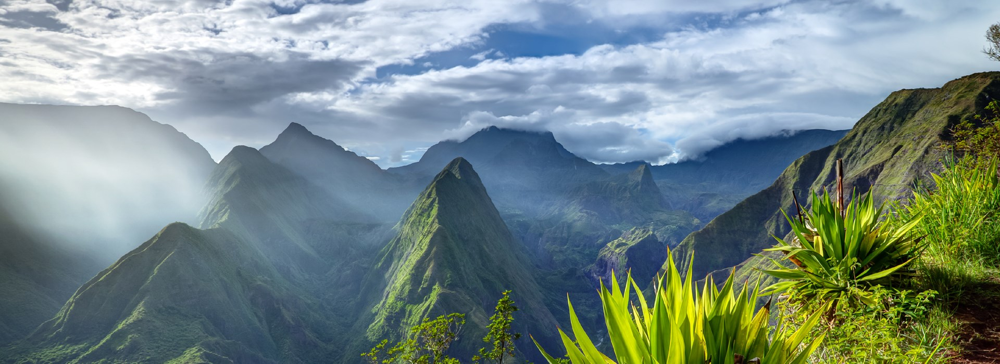

### Table of Contents

* Intro: Questions and search directions
    * Proxies for successful listings
    * Technical stack
    

* 1. Visualizing data on the map
    * 1.1 Dataset and setup
    * 1.2 Visualization on the map using Folium 
    

* 2. Exploring calendar data
    * 2.1 Dataset and setup
    * 2.2 Visualization on the map using Folium 


* 3. Exploring reviews
    * 3.1 Ratings repartition
    * 3.2 Comments over time 
    * 3.3 Exploring with bags of words
        * 3.3.1 Bag of words: Bad reviews 
        * 3.3.2 Bag of words: Good reviews
    
    
* 4. Exploring amenities
    * 4.1 Preparing amenities dataset
    * 4.2 Exploring amenities potential impact on reviews, ratings & price
        * 4.2.1 Amenities popularity
        * 4.2.2 Amenities ranked by number of reviews
        * 4.2.3 Amenities ranked by ratings
        * 4.2.4 Amenities ranked by price

# Questions and search directions <a class="anchor" id="Intro"></a>

We now have a the structured database below and a handful of questions that need answers (not exhaustive):
 - What is the market like in terms of types of homes, number of guests, amenities ? 
 - What are the most successful listings and what is special about them ? 
 - What is a successful listing ? 
 - What can we learn from reviews about what makes a good or bad stay at a airbnb ? 
 - Did Covid have an impact on the number of rentals ? 
 - What's the average price for a stay on Reunion Island ? Can we explain price differences ? 
 - Where are the listings on the map ? Are there enough lisitngs everywhere on the Island ?
 - Where are the areas with the most competition ?
 - How many different listings do people go to ? 
 - ...

As a reminder, the database we were able to build in the previous stage: 

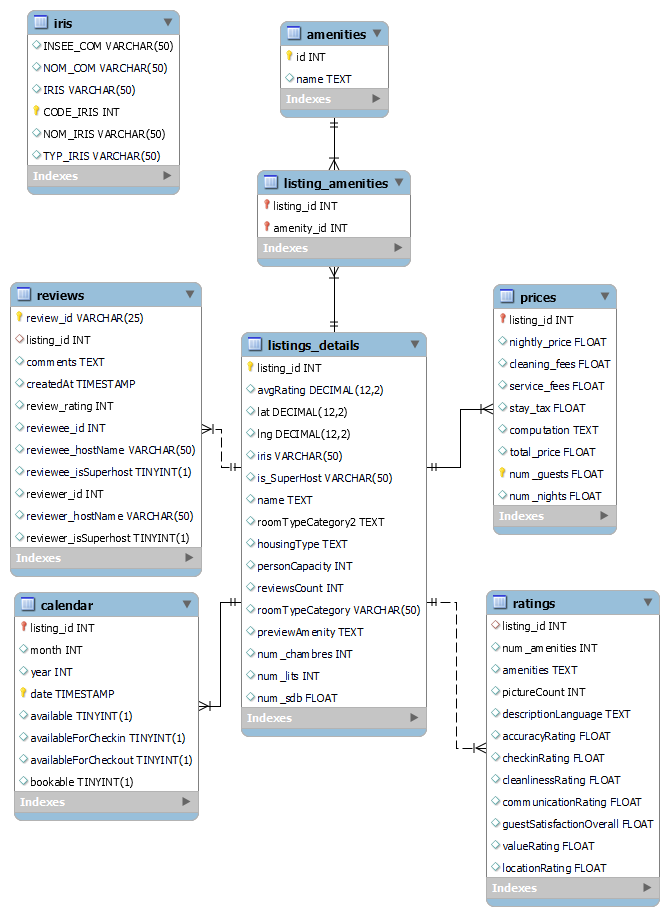

## Proxies for successful listings:  <a class="anchor" id="section_1_1"></a>

From a host perspective a successful rental is one that maximizes profitability (occupancy rate * price - costs) with the following possible proxies:
 - number of reviews
 - ratings (in particular value for money rating)
 - price per night  
 - price per night per bed 
 - price per night per guest
 - booking rate
 
From a guest perspective a successful rental is one with a good value for money:
 - value for money rating

## Technical stack <a class="anchor" id="section_1_2"></a>

We are going to use **python** and some useful libraries to carry out the EDA **(pandas,matplotlib,geopandas,folium...)**.

First we need to get the data from mysql to a pandas dataframe thanks to **pymysql**. 

#### Pymysql function to query the database 

In [1]:
import numpy as np
import pandas as pd
import pymysql as mysql
from pymysql import Error

In [2]:
def query_database(my_query):
    my_password = 'my_password'
    my_host = 'my_host '
    database_name = "run_airbnb_db"
    try:
        connection = mysql.connect(user='root', password=my_password, database=database_name, host=my_host)
        if connection:
            cursor = connection.cursor()
            cursor.execute(my_query)
            result = pd.DataFrame(cursor.fetchall())
            cursor.close()
            connection.close()
            columns = cursor.description
            column_headers=[column[0] for column in columns]
            print(column_headers)
            result.columns = column_headers
    except Error as e:
        print("Error while connecting to mysql:", e)
        result = pd.DataFrame("")
    return result

# 1. Visualizing data on the map <a class="anchor" id="chapter1"></a>

## 1.1 Let's first create a dataset encompassing the main information about each listing by merging some of the tables:
- first we want the features of a listing (number of rooms, beds, capacity, type, amenities...) from table listing details 
- then the ratings given by guests (table ratings)
- finally we can complete the dataset with geographical data (table iris)

The join between listings_details & ratings needs to be a left join as some listings don't have a comment or rating yet and would otherwise be omitted 

In [3]:
my_query="select d.listing_id,d.reviewsCount,d.is_SuperHost,d.lat,d.lng,d.CODE_IRIS,i.NOM_COM,i.NOM_IRIS,"\
         "CASE WHEN d.housingType ='' THEN d.roomTypeCategory2 ELSE d.housingType END as housing_Type,"\
         "d.personCapacity, d.num_chambres,d.num_lits,d.num_sdb,"\
         "r.num_amenities,r.amenities,r.pictureCount,r.accuracyRating,r.checkinRating,r.cleanlinessRating,"\
         "r.communicationRating,r.guestSatisfactionOverall,r.valueRating,r.locationRating"\
             " from listings_details d"\
                 " left join ratings r on d.listing_id=r.listing_id"\
                 " join iris i on d.CODE_IRIS=i.CODE_IRIS;"

In [4]:
main_df=query_database(my_query)

['listing_id', 'reviewsCount', 'is_SuperHost', 'lat', 'lng', 'CODE_IRIS', 'NOM_COM', 'NOM_IRIS', 'housing_Type', 'personCapacity', 'num_chambres', 'num_lits', 'num_sdb', 'num_amenities', 'amenities', 'pictureCount', 'accuracyRating', 'checkinRating', 'cleanlinessRating', 'communicationRating', 'guestSatisfactionOverall', 'valueRating', 'locationRating']


In [5]:
main_df

,listing_id,reviewsCount,is_SuperHost,lat,lng,CODE_IRIS,NOM_COM,NOM_IRIS,housing_Type,personCapacity,...,num_amenities,amenities,pictureCount,accuracyRating,checkinRating,cleanlinessRating,communicationRating,guestSatisfactionOverall,valueRating,locationRating
0,398772,17,False,-21.05,55.22,974151203,Saint-Paul,Saint-Gilles les Bains Centre,appartement,2,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,667249,103,False,-20.89,55.43,974111201,Saint-Denis,7e Km-La Vigie-Les Brises,Chambre privée,2,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,770092,12,False,-21.22,55.35,974010101,Les Avirons,La Ville-Bois de Nèfles-Le Ruisseau,logement résidentiel,2,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,809053,172,True,-21.02,55.28,974151002,Saint-Paul,La Renaissance-Lycée Plateau Caillou,guest house,2,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,809871,106,False,-21.05,55.27,974151102,Saint-Paul,Saint-Gilles les Hauts Centre et Hauts,appartement,4,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3061,53221036,0,False,-20.88,55.45,974110102,Saint-Denis,Le Bas de la Rivière,appartement en résidence,4,...,2.0,"[99, 104]",8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3062,53225074,0,False,-21.07,55.52,974210301,Salazie,Hell Bourg,logement de vacances,4,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3063,53229946,0,False,-21.05,55.68,974100107,Saint-Benoît,Bras Canot-Le Cratère,logement résidentiel,16,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3064,53232035,0,False,-21.36,55.77,974170101,Saint-Philippe,Centre-Mare Longue-Est,logement résidentiel,5,...,25.0,"[1, 2, 4, 5, 7, 8, 9, 12, 77, 85, 89, 90, 91, ...",0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
main_df.describe()

,listing_id,reviewsCount,personCapacity,num_chambres,num_lits,num_sdb,num_amenities,pictureCount,accuracyRating,checkinRating,cleanlinessRating,communicationRating,guestSatisfactionOverall,valueRating,locationRating
count,3.066000e+03,3066.000000,3066.000000,3066.000000,3066.000000,3066.000000,2946.000000,2946.000000,2566.000000,2566.000000,2566.000000,2566.000000,2575.000000,2566.000000,2566.000000
mean,3.353153e+07,23.245923,4.086432,1.709393,2.306588,1.184116,29.658859,15.843517,4.765300,4.847366,4.715210,4.848122,4.703748,4.644790,4.716571
std,1.442195e+07,37.855036,2.514824,1.029114,1.719081,0.510355,12.997037,11.751572,0.387966,0.330321,0.440133,0.354386,0.478848,0.453305,0.364365
min,3.987720e+05,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
25%,2.212385e+07,2.000000,2.000000,1.000000,1.000000,1.000000,19.000000,8.000000,4.720000,4.830000,4.630000,4.850000,4.620000,4.520000,4.620000
50%,3.568443e+07,9.000000,4.000000,1.000000,2.000000,1.000000,29.000000,13.000000,4.880000,4.940000,4.850000,4.950000,4.830000,4.750000,4.800000
75%,4.614204e+07,28.000000,5.000000,2.000000,3.000000,1.000000,38.000000,20.000000,5.000000,5.000000,5.000000,5.000000,4.980000,4.910000,4.960000
max,5.323345e+07,499.000000,16.000000,8.000000,20.000000,6.000000,84.000000,111.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


#### Before adding data regarding price we need to engineer the features introduced earlier, namely:
 - price per night  
 - price per night per bed 
 - price per night per guest

Here for simplicity's sake we choose to compare the listings in terms of price when they are booked **at maximum capacity** (we could have chosen a more complex proxy as the fees vary with the number of guests

##### We first compute the full price by adding the night rate and fees 

In [7]:
prices_df=query_database("select * from prices")
prices_df['complete_price_per_night']=(prices_df['nightly_price']*prices_df['num_nights']+prices_df['cleaning_fees']+prices_df['service_fees']+prices_df['stay_tax'])/prices_df['num_nights']   
prices_df['complete_price_per_night_per_pers']=(prices_df['nightly_price']*prices_df['num_nights']+prices_df['cleaning_fees']+prices_df['service_fees']+prices_df['stay_tax'])/prices_df['num_guests']/prices_df['num_nights']   
prices_df

['listing_id', 'nightly_price', 'cleaning_fees', 'service_fees', 'stay_tax', 'computation', 'total_price', 'num_guests', 'num_nights']


,listing_id,nightly_price,cleaning_fees,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night,complete_price_per_night_per_pers
0,1004534,55.0,25.0,60.0,0.0,55€ x 7 nuits,385.0,1.0,7.0,67.142857,67.142857
1,1004534,55.0,25.0,60.0,0.0,55€ x 7 nuits,385.0,2.0,7.0,67.142857,33.571429
2,1065135,45.0,30.0,47.0,0.0,45€ x 7 nuits,315.0,1.0,7.0,56.000000,56.000000
3,1065135,45.0,30.0,47.0,0.0,45€ x 7 nuits,315.0,2.0,7.0,56.000000,28.000000
4,1206948,40.0,20.0,51.0,14.0,40€ x 7 nuits,280.0,1.0,7.0,52.142857,52.142857
...,...,...,...,...,...,...,...,...,...,...,...
11989,53232035,140.0,0.0,0.0,63.0,140€ x 9 nuits,1256.0,3.0,9.0,147.000000,49.000000
11990,53232035,140.0,0.0,0.0,63.0,140€ x 9 nuits,1256.0,4.0,9.0,147.000000,36.750000
11991,53232035,140.0,0.0,0.0,63.0,140€ x 9 nuits,1256.0,5.0,9.0,147.000000,29.400000
11992,53233447,103.0,0.0,0.0,28.0,103€ x 7 nuits,723.0,1.0,7.0,107.000000,107.000000


##### We then find the maximum capacity for each listing (we could also have joined the listings_details table as this information already exists there)

In [8]:
grouped_df=prices_df.groupby('listing_id')['num_guests'].max()
grouped_df

listing_id
1004534     2.0
1065135     2.0
1206948     2.0
1387014     2.0
1523398     7.0
           ... 
53207051    4.0
53211593    2.0
53221036    4.0
53232035    5.0
53233447    2.0
Name: num_guests, Length: 2946, dtype: float64

##### Finally we only keep the price for the max capacity

In [9]:
prices_df=prices_df.merge(grouped_df, on=['listing_id','num_guests'])
prices_df

,listing_id,nightly_price,cleaning_fees,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night,complete_price_per_night_per_pers
0,1004534,55.0,25.0,60.0,0.0,55€ x 7 nuits,385.0,2.0,7.0,67.142857,33.571429
1,1065135,45.0,30.0,47.0,0.0,45€ x 7 nuits,315.0,2.0,7.0,56.000000,28.000000
2,1206948,40.0,20.0,51.0,14.0,40€ x 7 nuits,280.0,2.0,7.0,52.142857,26.071429
3,1387014,44.0,25.0,27.0,7.0,44€ x 3 nuits,133.0,2.0,3.0,63.666667,31.833333
4,1523398,110.0,0.0,124.0,37.0,110€ x 7 nuits,771.0,7.0,7.0,133.000000,19.000000
...,...,...,...,...,...,...,...,...,...,...,...
2941,53207051,58.0,0.0,88.0,26.0,58€ x 9 nuits,522.0,4.0,9.0,70.666667,17.666667
2942,53211593,40.0,0.0,41.0,12.0,40€ x 7 nuits,282.0,2.0,7.0,47.571429,23.785714
2943,53221036,100.0,0.0,152.0,45.0,100€ x 9 nuits,900.0,4.0,9.0,121.888889,30.472222
2944,53232035,140.0,0.0,0.0,63.0,140€ x 9 nuits,1256.0,5.0,9.0,147.000000,29.400000


##### We can now add the price information to our main dataset

In [10]:
main_df=main_df.merge(prices_df,on=['listing_id'])
main_df.drop('complete_price_per_night',axis=1,inplace=True)

##### Average price per night

In [11]:
avg_price=prices_df.groupby('listing_id')['complete_price_per_night'].mean()
avg_price

listing_id
1004534      67.142857
1065135      56.000000
1206948      52.142857
1387014      63.666667
1523398     133.000000
               ...    
53207051     70.666667
53211593     47.571429
53221036    121.888889
53232035    147.000000
53233447    107.142857
Name: complete_price_per_night, Length: 2946, dtype: float64

In [12]:
main_df=main_df.merge(avg_price,on=['listing_id'])
main_df

,listing_id,reviewsCount,is_SuperHost,lat,lng,CODE_IRIS,NOM_COM,NOM_IRIS,housing_Type,personCapacity,...,nightly_price,cleaning_fees,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night_per_pers,complete_price_per_night
0,1004534,94,True,-21.23,55.55,974221201,Le Tampon,Les 19e et 23e Km,bungalow,2,...,55.0,25.0,60.0,0.0,55€ x 7 nuits,385.0,2.0,7.0,33.571429,67.142857
1,1065135,83,False,-21.34,55.49,974160803,Saint-Pierre,L'Asile-ZAC Océan Indien,appartement,2,...,45.0,30.0,47.0,0.0,45€ x 7 nuits,315.0,2.0,7.0,28.000000,56.000000
2,1206948,1,False,-21.17,55.29,974130101,Saint-Leu,Saint-Leu Ville,villa,2,...,40.0,20.0,51.0,14.0,40€ x 7 nuits,280.0,2.0,7.0,26.071429,52.142857
3,1387014,11,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,maison de ville,2,...,44.0,25.0,27.0,7.0,44€ x 3 nuits,133.0,2.0,3.0,31.833333,63.666667
4,1523398,46,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,logement résidentiel,7,...,110.0,0.0,124.0,37.0,110€ x 7 nuits,771.0,7.0,7.0,19.000000,133.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2941,53207051,0,False,-21.05,55.23,974151203,Saint-Paul,Saint-Gilles les Bains Centre,appartement en résidence,4,...,58.0,0.0,88.0,26.0,58€ x 9 nuits,522.0,4.0,9.0,17.666667,70.666667
2942,53211593,0,True,-21.01,55.68,974100109,Saint-Benoît,Bourbier-Beauvallon,guest house,2,...,40.0,0.0,41.0,12.0,40€ x 7 nuits,282.0,2.0,7.0,23.785714,47.571429
2943,53221036,0,False,-20.88,55.45,974110102,Saint-Denis,Le Bas de la Rivière,appartement en résidence,4,...,100.0,0.0,152.0,45.0,100€ x 9 nuits,900.0,4.0,9.0,30.472222,121.888889
2944,53232035,0,False,-21.36,55.77,974170101,Saint-Philippe,Centre-Mare Longue-Est,logement résidentiel,5,...,140.0,0.0,0.0,63.0,140€ x 9 nuits,1256.0,5.0,9.0,29.400000,147.000000


## 1.2 Let's now try to get a sense of the market by visulazing key features (number of listings...) on the map

In [13]:
import folium
import geopandas

##### Loading French IRIS Data

In [14]:
iris_gdf = geopandas.read_file('../CONTOURS-IRIS_2-1_SHP_RGR92UTM40S_REU-2021/CONTOURS-IRIS.shp')

##### Dataset for vizualisation on map (selecting main features to display)

In [15]:
visualization_df=main_df[['CODE_IRIS','NOM_IRIS','listing_id','locationRating','complete_price_per_night_per_pers','reviewsCount']]
visualization_df

,CODE_IRIS,NOM_IRIS,listing_id,locationRating,complete_price_per_night_per_pers,reviewsCount
0,974221201,Les 19e et 23e Km,1004534,4.53,33.571429,94
1,974160803,L'Asile-ZAC Océan Indien,1065135,4.62,28.000000,83
2,974130101,Saint-Leu Ville,1206948,NaN,26.071429,1
3,974120101,Centre Ville,1387014,4.90,31.833333,11
4,974120101,Centre Ville,1523398,4.45,19.000000,46
...,...,...,...,...,...,...
2941,974151203,Saint-Gilles les Bains Centre,53207051,NaN,17.666667,0
2942,974100109,Bourbier-Beauvallon,53211593,5.00,23.785714,0
2943,974110102,Le Bas de la Rivière,53221036,NaN,30.472222,0
2944,974170101,Centre-Mare Longue-Est,53232035,NaN,29.400000,0


##### We need to aggregate data per geographical area

In [16]:
folium_df=visualization_df.groupby("CODE_IRIS").agg(
    num_listings=("listing_id", "count"),
    num_reviews=("reviewsCount", "sum"),
    avg_reviews=("reviewsCount", np.mean),
    avg_location_rating  =("locationRating", np.mean),
    avg_price=("complete_price_per_night_per_pers",np.mean),
    
)
folium_df

,num_listings,num_reviews,avg_reviews,avg_location_rating,avg_price
CODE_IRIS,,,,,
974010101,52,645,12.403846,4.697209,27.079977
974010102,23,366,15.913043,4.635789,25.225276
974010201,2,0,0.000000,NaN,23.485714
974020102,5,207,41.400000,4.538000,36.739021
974030101,9,274,30.444444,4.683750,33.139418
...,...,...,...,...,...
974240101,52,3731,71.750000,4.878824,35.013348
974240102,25,950,38.000000,4.768261,37.944317
974240103,9,443,49.222222,4.741111,26.903108


##### Here we compute mean on the whole dataset for number of reviews and price in order to detect a contribution of the geographical area on those factors (reviews_contrib & price_contrib)

In [17]:
avg_reviews_overall=visualization_df['reviewsCount'].mean()
avg_reviews_overall

23.267820773930755

In [18]:
avg_price_overall=visualization_df['complete_price_per_night_per_pers'].mean()
avg_price_overall

32.46548009646925

In [19]:
folium_df['reviews_contrib']=folium_df['avg_reviews']-avg_reviews_overall
folium_df['price_contrib']=folium_df['avg_price']-avg_price_overall
folium_df=folium_df.round({'avg_reviews': 0, 'avg_location_rating': 2,'avg_price':0,'reviews_contrib':1,'price_contrib':1})
# folium_df.round(1)
folium_df.reset_index(inplace=True)
folium_df

,CODE_IRIS,num_listings,num_reviews,avg_reviews,avg_location_rating,avg_price,reviews_contrib,price_contrib
0,974010101,52,645,12.0,4.70,27.0,-10.9,-5.4
1,974010102,23,366,16.0,4.64,25.0,-7.4,-7.2
2,974010201,2,0,0.0,NaN,23.0,-23.3,-9.0
3,974020102,5,207,41.0,4.54,37.0,18.1,4.3
4,974030101,9,274,30.0,4.68,33.0,7.2,0.7
...,...,...,...,...,...,...,...,...
241,974240101,52,3731,72.0,4.88,35.0,48.5,2.5
242,974240102,25,950,38.0,4.77,38.0,14.7,5.5
243,974240103,9,443,49.0,4.74,27.0,26.0,-5.6
244,974240104,7,593,85.0,4.75,32.0,61.4,-0.6


### Create a reusable function for choropleth map creation (Folium) <a class="anchor" id="section_2_2"></a>

In [20]:
def create_choropleth(data,columns,bins,fields,legend_name,title):
    # Centers the map on Reunion Island and initialize map
    center = [-21.127597, 55.545888]
    my_map = folium.Map(location=center)

    # Data (abnb data) and geodata (Iris geometries and data) to use in Choropleth
    data = data
    geo_data = iris_gdf[['geometry', 'CODE_IRIS','NOM_COM', 'NOM_IRIS']]

    # Let's merge the 2 to be able to use abnb data in labels 
    merged = geo_data.merge(data, on='CODE_IRIS')

    # Create Choropleth map, as we merged the 2 datasets only the geometries (Iris) with data in both datasets will be displayed
    my_Choropleth_map=folium.Choropleth(
        geo_data=merged,
        name="choropleth",
        data=data,
        columns=columns,
        key_on='feature.properties.CODE_IRIS',
        bins=bins,
        fill_color="OrRd",
        fill_opacity=0.7,
        line_opacity=0.3,
        nan_fill_color="grey",
        nan_fill_opacity=0.7,
        legend_name=legend_name,
        highlight=True
    ).add_to(my_map)


    folium.features.GeoJsonTooltip(fields=fields, aliases=None, labels=True, localize=False, style=None,
                                   class_name='foliumtooltip', sticky=True).add_to(my_Choropleth_map.geojson)

    folium.LayerControl().add_to(my_map)

    my_map.save(f"{title}.html")
    
    return my_map

### Area attractivity based on number of reviews 

In [21]:
columns=["CODE_IRIS", "num_reviews"]
bins=[0,100,500,1500,2500,4000]
fields=['NOM_COM', 'NOM_IRIS', "num_reviews","num_listings"]
legend_name="area attrictivity based on number of reviews"
title="map_reviews"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

##### Without much surprise the circuses (center of the Island) and the west coast boast the high numbers of reviews.

### Attractivity and competition based on average number of reviews per listing

In [22]:
columns=["CODE_IRIS", "avg_reviews"]
bins=[0,25,50,100,200]
fields=['NOM_COM', 'NOM_IRIS', "avg_reviews","num_listings"]
legend_name="area attrictivity based on number of reviews per listing"
title="map_reviews_per_listing"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here we can notice that the competition seems to be fairly well distributed. Some areas though exhibit a higher numbers reviews per listing (le tampon, zone forestière) often with a small offer of listings. **Sign of a lesser competition and a good opportunity for investment ?**

### Area attractivity based on ratings

In [23]:
columns=["CODE_IRIS", "avg_location_rating"]
bins=[3,4.7,4.8,4.9,5]
fields=['NOM_COM', 'NOM_IRIS', "avg_location_rating","num_listings"]
legend_name="area attrictivity based on location ratings"
title="map_ratings"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here again based on ratings we find that the best stays happen in the touristic part of the Island (west and center). Data is a bit biased as some means are computed only on a few listings and tend to skew the vision. Below is a visualization corrected for small number of listings.

In [24]:
columns=["CODE_IRIS", "avg_location_rating"]
bins=[3,4.7,4.8,4.9,5]
fields=['NOM_COM', 'NOM_IRIS', "avg_location_rating","num_listings"]
legend_name="area attrictivity based on location ratings where more than 5 listings received a review"
data=folium_df[folium_df['num_listings']>5]
title="map_ratings_unbiased"
create_choropleth(data,columns,bins,fields,legend_name,title)

### Intensity of competition based on number of listings 

In [25]:
columns=["CODE_IRIS", "num_listings"]
bins=[0,25,50,100,200,300]
fields=['NOM_COM', 'NOM_IRIS',"num_listings"]
legend_name="area attrictivity based on number of listings"
title="map_num_of_listings"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here what's surprising is the low offer in Saint Denis, the capital city, in the North as it is the biggest city on the Island, close to the main airport and scored quite well in terms of attractivity in the displays above. **An untapped source of side income ?**

It could be intersting to collect data regarding population to get a better sense of competition in those areas. 

# 2. Exploring calendar data <a class="anchor" id="chapter2"></a>

##### Loading Data

In [26]:
calendar_df=query_database("select * from calendar")
calendar_df

['listing_id', 'month', 'year', 'date', 'available', 'availableForCheckin', 'availableForCheckout', 'bookable']


,listing_id,month,year,date,available,availableForCheckin,availableForCheckout,bookable
0,398772,4,2022,2022-04-01,1,1,1,1.0
1,398772,4,2022,2022-04-02,1,1,1,1.0
2,398772,4,2022,2022-04-03,1,1,1,1.0
3,398772,4,2022,2022-04-04,1,1,1,1.0
4,398772,4,2022,2022-04-05,1,1,1,1.0
...,...,...,...,...,...,...,...,...
1108135,53233447,2,2023,2023-02-24,1,0,0,0.0
1108136,53233447,2,2023,2023-02-25,1,0,0,0.0
1108137,53233447,2,2023,2023-02-26,1,0,0,0.0
1108138,53233447,2,2023,2023-02-27,1,0,0,0.0


In [27]:
grouped_by_date =calendar_df.groupby('date')

with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(grouped_by_date['listing_id'].count())

date
2021-11-01     332
2021-11-02     332
2021-11-03     332
2021-11-04     332
2021-11-05     332
2021-11-06     332
2021-11-07     332
2021-11-08     332
2021-11-09     332
2021-11-10     332
2021-11-11     332
2021-11-12     332
2021-11-13     332
2021-11-14     332
2021-11-15     332
2021-11-16     332
2021-11-17     332
2021-11-18     332
2021-11-19     332
2021-11-20     332
2021-11-21     332
2021-11-22     332
2021-11-23     332
2021-11-24     332
2021-11-25     332
2021-11-26     332
2021-11-27     332
2021-11-28     332
2021-11-29     332
2021-11-30     332
2021-12-01     677
2021-12-02     677
2021-12-03     677
2021-12-04     677
2021-12-05     677
2021-12-06     677
2021-12-07     677
2021-12-08     677
2021-12-09     677
2021-12-10     677
2021-12-11     677
2021-12-12     677
2021-12-13     677
2021-12-14     677
2021-12-15     677
2021-12-16     677
2021-12-17     677
2021-12-18     677
2021-12-19     677
2021-12-20     677
2021-12-21     677
2021-12-22     677
2021-12

As we can see **the data was not collected correctly** as we did not get the same range of dates which will make it difficult to compare between listings over time or get a sense of the market over time... 

##### Let's now study the availability of listings.

<AxesSubplot:ylabel='Frequency'>

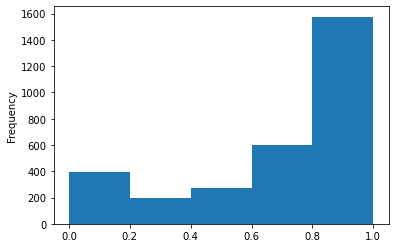

In [28]:
bookability_df=calendar_df.groupby('listing_id').agg(
    bookability_ratio=("bookable", np.mean),
    bookable_days=("bookable", 'sum')
)
# bookability_df.sort_values(by='bookable_days')

bookability_df['bookability_ratio'].plot.hist(bins=5)

##### The feature bookable seems to indicate the days when a listing is open for rental (available or not).  (a ratio of 0 = never put on the market by the host, a ratio of 1 = on the market the whole year) 

A majority of the listings are on the market more than 80% of the year

##### Analysing availablity

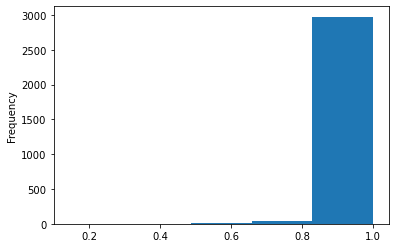

In [29]:
bookable_df=calendar_df[calendar_df['bookable']==1]

availability_df=bookable_df.groupby('listing_id').agg(
    availability_ratio=("availableForCheckin", np.mean),
    bookable_days=("bookable", 'sum')
)

availability_df=availability_df.reset_index()

with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
#     print(availability_df.round(2).sort_values(by=['availability_ratio']))
    availability_df['availability_ratio'].plot.hist(bins=5)

##### Once we take into account only the days a listing is on the market, and looking for the next 12 months, only a small part of listings boast a high occupancy rate.  (WARNING: this ratio is available on the day the data starts to be collected, here the data was collected early november, at the start of the high season)

In [30]:
availability_df[['availability_ratio','bookable_days']].corr()

,availability_ratio,bookable_days
availability_ratio,1.000000,0.472789
bookable_days,0.472789,1.000000


There is a low correlation between the number of bookable days and the availability ratio. Some listings on the market the whole year are already reserved a lot for the coming 12 months.

##### Let's add those features to our main dataframe:

In [31]:
main_df=main_df.merge(availability_df,on=['listing_id'])

Let's dive into the listings with a low availability rate

In [32]:
low_availaility_listings=main_df[(main_df['availability_ratio']<0.7) & (main_df['bookable_days']>250) ]
low_availaility_listings

,listing_id,reviewsCount,is_SuperHost,lat,lng,CODE_IRIS,NOM_COM,NOM_IRIS,housing_Type,personCapacity,...,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night_per_pers,complete_price_per_night,availability_ratio,bookable_days
1879,42081159,2,False,-21.37,55.64,974120105,Saint-Joseph,Les Jacques-Jean Petit les Bas,Maison dôme,3,...,51.0,15.0,100€ x 3 nuits,300.0,3.0,3.0,40.666667,122.000000,0.558824,272.0
2931,53197454,0,False,-21.18,55.29,974130101,Saint-Leu,Saint-Leu Ville,villa,4,...,256.0,40.0,159€ x 9 nuits,1431.0,4.0,9.0,50.194444,200.777778,0.142857,294.0


Those 2 listings boast the highest occupancy yet over the next 12 months and should be considered as good benchmarks. 

# 3. Exploring reviews <a class="anchor" id="chapter3"></a>

In [33]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [34]:
pip install spacy

Note: you may need to restart the kernel to use updated packages.


In [35]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from spacy.lang.fr.stop_words import STOP_WORDS as fr_stop
from spacy.lang.en.stop_words import STOP_WORDS as en_stop
from matplotlib.ticker import MaxNLocator

##### Loading Data

In [36]:
reviews_df=query_database("select * from reviews")
print(reviews_df.head())
print(reviews_df.info())

['review_id', 'listing_id', 'comments', 'createdAt', 'review_rating', 'reviewee_id', 'reviewee_hostName', 'reviewee_isSuperhost', 'reviewer_id', 'reviewer_hostName', 'reviewer_isSuperhost']
   review_id  listing_id                                           comments  \
0  100055965     4927687  le logement répondait parfaitement à  l'annonc...   
1  100105904    10910615  Nous avons été très bien accueillis par Chanta...   
2  100197072     6927209  Excellent accueil, logement très agréable et f...   
3  100197196     5888901  Super séjour de trois nuits au Pied du Cocotie...   
4  100198235    14519726  Laure a été très disponible, réactive et en pl...   

            createdAt  review_rating  reviewee_id   reviewee_hostName  \
0 2016-09-07 09:03:33              4     25384398           Dominique   
1 2016-09-07 11:48:13              4     56551392             Chantal   
2 2016-09-08 06:12:36              5     36314653           Christine   
3 2016-09-08 06:13:59              5     30

## 3.1 Plotting ratings repartition <a class="anchor" id="section_3_1"></a>

##### Let's first plot how ratings are distributed among the possible ratings from 1 to 5 

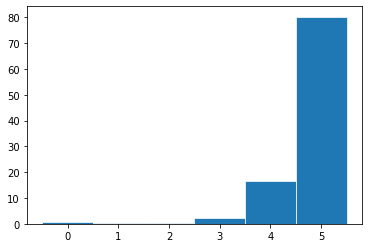

In [37]:
total_reviews=reviews_df['review_id'].count()
percentage_plot=round(reviews_df['review_rating'].value_counts()/total_reviews*100,1)
df = pd.DataFrame(percentage_plot)

df.reset_index(inplace=True)
df = df.rename(columns = {'index':'rating','review_rating':'percentage'})

x = df['rating']
y = df['percentage']
plt.bar(x, y, width=1, edgecolor="white", linewidth=0.7)
plt.show()

As one using Airbnb could exepect, the vast majority of ratings are 4 and 5.

##### Meaning of 0 values 

In [38]:
zeros=reviews_df[reviews_df['review_rating']==0]
zeros

,review_id,listing_id,comments,createdAt,review_rating,reviewee_id,reviewee_hostName,reviewee_isSuperhost,reviewer_id,reviewer_hostName,reviewer_isSuperhost
59,103124944,12463926,The host canceled this reservation 54 days bef...,2016-09-20 21:09:23,0,67449085,Patricia,0,58893589,Thomas,0
171,108707938,13323286,The host canceled this reservation 34 days bef...,2016-10-17 07:36:38,0,75359875,Khireddine,0,80397933,Kévin,0
176,10874945,1523398,Excellent séjour chez Solange et François.\r<b...,2014-03-11 11:52:24,0,7503402,Solange,0,2177353,Nora,0
538,120168571,14491045,The host canceled this reservation 28 days bef...,2016-12-08 11:57:09,0,89436014,Eddinho,0,27322712,Jochen,0
556,120837481,14987354,The host canceled this reservation 60 days bef...,2016-12-12 06:09:27,0,94466165,Valérie,0,22352297,Omar,0
...,...,...,...,...,...,...,...,...,...,...,...
51168,96962838,6916797,The host canceled this reservation 66 days bef...,2016-08-25 10:37:52,0,36252918,Florian,0,5039331,François,0
51169,97014334,14491045,The host canceled this reservation 57 days bef...,2016-08-25 15:17:27,0,89436014,Eddinho,0,66070092,Carine,0
51170,97014845,14491045,The host canceled this reservation 51 days bef...,2016-08-25 15:24:46,0,89436014,Eddinho,0,34814952,Mireille,0
51172,97182123,14409770,The host canceled this reservation 55 days bef...,2016-08-26 10:50:17,0,88627426,Virginie,0,91943269,Martine,0


##### As we can see the 0 value means that the stay was canceled, those comments change the meaning of the averages and should thus be analysed separately.

In [39]:
not_zeros=reviews_df[reviews_df['review_rating']!=0].copy()
not_zeros

,review_id,listing_id,comments,createdAt,review_rating,reviewee_id,reviewee_hostName,reviewee_isSuperhost,reviewer_id,reviewer_hostName,reviewer_isSuperhost
0,100055965,4927687,le logement répondait parfaitement à l'annonc...,2016-09-07 09:03:33,4,25384398,Dominique,0,74931066,Stephane,0
1,100105904,10910615,Nous avons été très bien accueillis par Chanta...,2016-09-07 11:48:13,4,56551392,Chantal,0,90005209,Michele,0
2,100197072,6927209,"Excellent accueil, logement très agréable et f...",2016-09-08 06:12:36,5,36314653,Christine,0,39187294,Anna,0
3,100197196,5888901,Super séjour de trois nuits au Pied du Cocotie...,2016-09-08 06:13:59,5,30583275,Ducocotier,0,36212700,Jonathan,0
4,100198235,14519726,"Laure a été très disponible, réactive et en pl...",2016-09-08 06:23:26,4,6222338,Laure & Christophe,0,12919030,Eric & Reyaz,0
...,...,...,...,...,...,...,...,...,...,...,...
51202,99760381,2264568,Le logement était très propre et adapté pour u...,2016-09-06 04:15:06,5,11534605,Guenelle,0,67584597,Amandine,0
51203,99775789,7964358,"Accueil ; excellent, \r<br/>Des partages de mo...",2016-09-06 04:59:07,4,42016913,Xavier,0,38062888,Pascal,0
51204,99789630,11669552,Nous avons été très bien accueillis par Philip...,2016-09-06 05:39:49,5,61954570,Philippe,0,52854125,Laura,0
51205,99865940,7875360,Un séjour un peu court mais très agréable chez...,2016-09-06 09:53:32,5,37189349,Damien Et Luc,0,63048553,Zoé,0


## 3.2 Plotting comments over time <a class="anchor" id="section_3_2"></a>

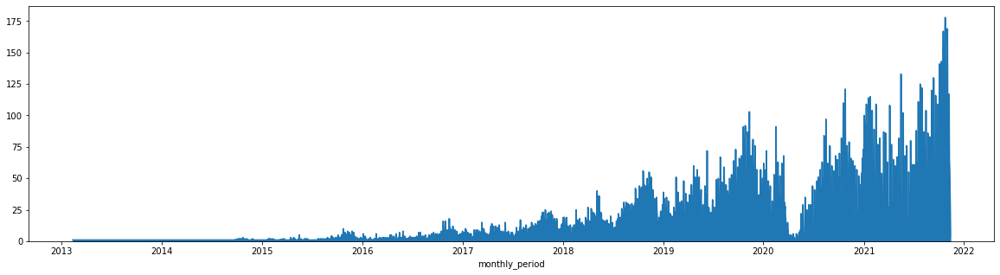

In [40]:
not_zeros['monthly_period'] = not_zeros['createdAt'].dt.date

not_zeros \
    .groupby('monthly_period')['review_id'] \
    .count().plot(kind='area', figsize=(20, 5), stacked=True)
plt.show()

We can observe the impact of Covid 19 in the beginning of 2020 and famous international trail competition 'le grand raid' held in october each year

## 3.3 Exploring with bags of words <a class="anchor" id="section_3_3"></a>

##### Preparing bag of words stop words list

In [41]:
final_stopwords_list = list(fr_stop) + list(en_stop)+["s'est","J'ai","n'est","qu'elle","n'était","Airbnb","Rbnb","n'a","jusqu'aux","m'a","d'une","jusqu'à","n'ai","d'y","séjour","suite","d'elle","l'a","br","Réunion","c'est","y","très","d","d'","très","qu'il","n'y"]

### 3.3.1 Plotting Bad reviews as a bag of words <a class="anchor" id="section_3_3_1"></a>

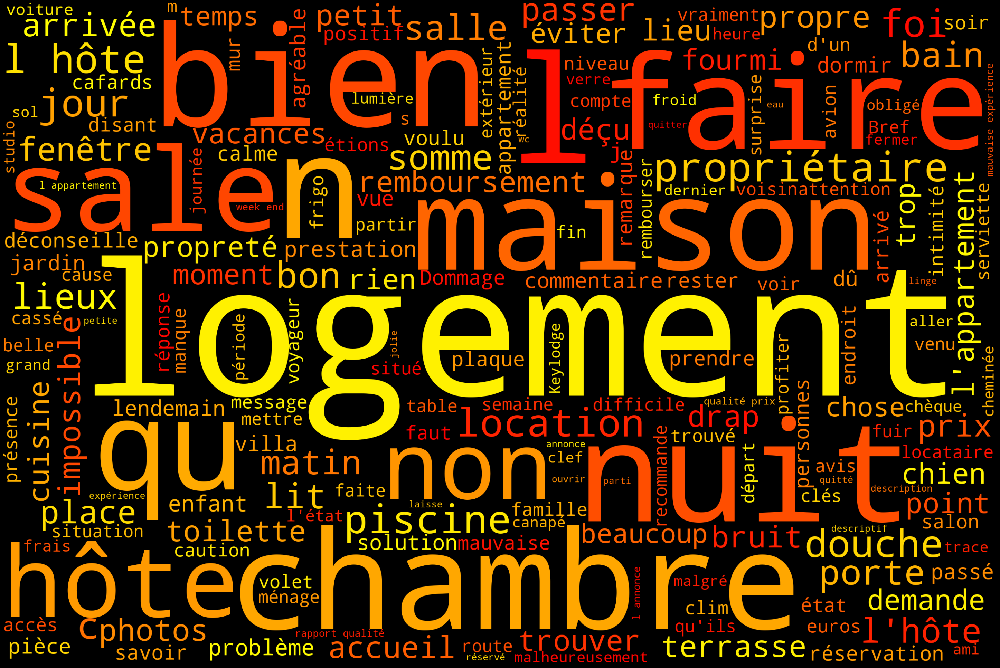

In [42]:
bad_reviews = reviews_df.loc[reviews_df['review_rating'] == 1]
bad_reviews_text = bad_reviews['comments'].str.cat(sep=' ')

wordcloud = WordCloud(
    width=3000,
    height=2000,
    colormap='autumn',
    background_color='black',
    stopwords=final_stopwords_list).generate(bad_reviews_text)

fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()


### 3.3.2 Plotting Good reviews as a bag of words <a class="anchor" id="section_3_3_2"></a>

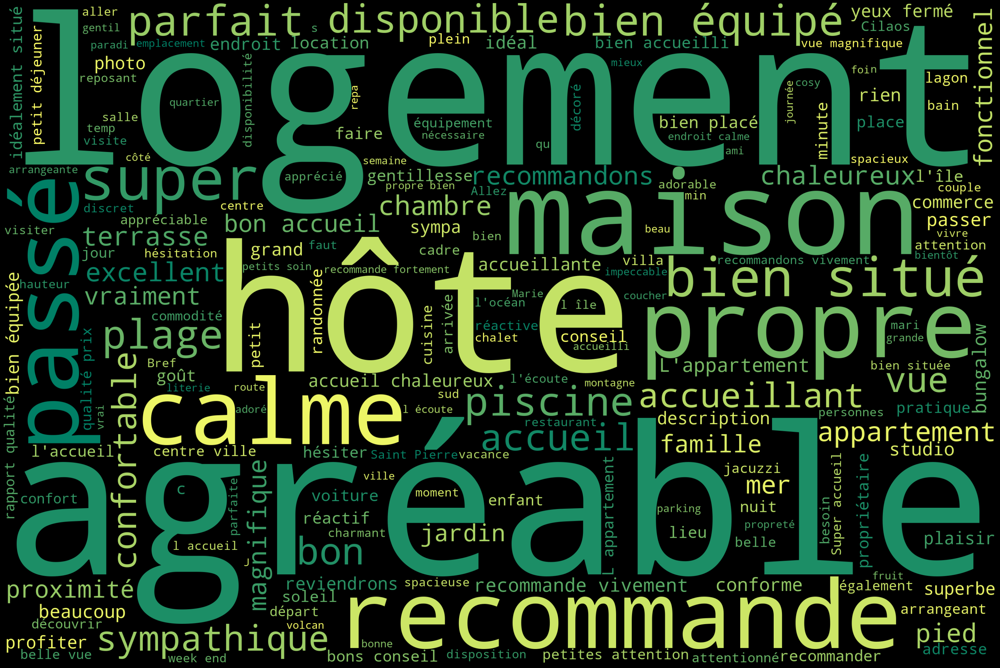

In [43]:
good_reviews = reviews_df.loc[reviews_df['review_rating'] == 5]
good_reviews_text = good_reviews['comments'].str.cat(sep=' ')

wordcloud = WordCloud(
    width=3000,
    height=2000,
    colormap='summer',
    background_color='black',
    stopwords=final_stopwords_list).generate(good_reviews_text)

fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Reviews insigths

- Bad reviews seems to revolve around **problems with cleanliness (especially the bathrooms and toilets), noise and relations with the host (especially at arrival)**. Those are aspects that can be easily corrected in order to avoid this kind of reviews.


- Good reviews on the other end put the emphasis on **cleanliness, location and amenities**. We've covered location a bit while diplaying the listings on the map. Cleanliness is easily controllable. Amenities is coming nect 

# 4. Exploring amenities <a class="anchor" id="chapter4"></a>

## 4.1 Preparing amenities dataset <a class="anchor" id="chapter4"></a>

In [44]:
amenities_query="select * from listing_amenities l join amenities a on a.id=l.amenity_id;"

In [45]:
amenities_df=query_database(amenities_query)
print(amenities_df.head())
print(amenities_df.info())

['listing_id', 'amenity_id', 'id', 'name']
   listing_id  amenity_id  id                                  name
0     1004534           1   1  TV avec abonnement standard au câble
1     1065135           1   1  TV avec abonnement standard au câble
2     1206948           1   1  TV avec abonnement standard au câble
3     1387014           1   1  TV avec abonnement standard au câble
4     1523398           1   1  TV avec abonnement standard au câble
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84230 entries, 0 to 84229
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   listing_id  84230 non-null  int64 
 1   amenity_id  84230 non-null  int64 
 2   id          84230 non-null  int64 
 3   name        84230 non-null  object
dtypes: int64(3), object(1)
memory usage: 2.6+ MB
None


In [46]:
temp_df=main_df.copy()
temp_df

,listing_id,reviewsCount,is_SuperHost,lat,lng,CODE_IRIS,NOM_COM,NOM_IRIS,housing_Type,personCapacity,...,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night_per_pers,complete_price_per_night,availability_ratio,bookable_days
0,1004534,94,True,-21.23,55.55,974221201,Le Tampon,Les 19e et 23e Km,bungalow,2,...,60.0,0.0,55€ x 7 nuits,385.0,2.0,7.0,33.571429,67.142857,0.997015,335.0
1,1065135,83,False,-21.34,55.49,974160803,Saint-Pierre,L'Asile-ZAC Océan Indien,appartement,2,...,47.0,0.0,45€ x 7 nuits,315.0,2.0,7.0,28.000000,56.000000,0.990654,214.0
2,1206948,1,False,-21.17,55.29,974130101,Saint-Leu,Saint-Leu Ville,villa,2,...,51.0,14.0,40€ x 7 nuits,280.0,2.0,7.0,26.071429,52.142857,1.000000,365.0
3,1387014,11,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,maison de ville,2,...,27.0,7.0,44€ x 3 nuits,133.0,2.0,3.0,31.833333,63.666667,0.967427,307.0
4,1523398,46,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,logement résidentiel,7,...,124.0,37.0,110€ x 7 nuits,771.0,7.0,7.0,19.000000,133.000000,1.000000,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2936,53207051,0,False,-21.05,55.23,974151203,Saint-Paul,Saint-Gilles les Bains Centre,appartement en résidence,4,...,88.0,26.0,58€ x 9 nuits,522.0,4.0,9.0,17.666667,70.666667,0.981595,326.0
2937,53211593,0,True,-21.01,55.68,974100109,Saint-Benoît,Bourbier-Beauvallon,guest house,2,...,41.0,12.0,40€ x 7 nuits,282.0,2.0,7.0,23.785714,47.571429,1.000000,365.0
2938,53221036,0,False,-20.88,55.45,974110102,Saint-Denis,Le Bas de la Rivière,appartement en résidence,4,...,152.0,45.0,100€ x 9 nuits,900.0,4.0,9.0,30.472222,121.888889,1.000000,347.0
2939,53232035,0,False,-21.36,55.77,974170101,Saint-Philippe,Centre-Mare Longue-Est,logement résidentiel,5,...,0.0,63.0,140€ x 9 nuits,1256.0,5.0,9.0,29.400000,147.000000,1.000000,287.0


In [47]:
amenities_EDA=amenities_df.merge(temp_df[['listing_id','reviewsCount','complete_price_per_night_per_pers','guestSatisfactionOverall']], on=['listing_id'])
amenities_EDA

,listing_id,amenity_id,id,name,reviewsCount,complete_price_per_night_per_pers,guestSatisfactionOverall
0,1004534,1,1,TV avec abonnement standard au câble,94,33.571429,4.68
1,1004534,2,2,Vue sur la plage,94,33.571429,4.68
2,1004534,4,4,Wifi,94,33.571429,4.68
3,1004534,8,8,Cuisine,94,33.571429,4.68
4,1004534,9,9,Parking gratuit sur place,94,33.571429,4.68
...,...,...,...,...,...,...,...
84123,28900935,104,104,Séjours longue durée autorisés,4,14.500000,4.00
84124,53221036,99,99,Barbecue,0,30.472222,NaN
84125,53221036,104,104,Séjours longue durée autorisés,0,30.472222,NaN
84126,52593011,104,104,Séjours longue durée autorisés,0,38.000000,NaN


## 4.2 Ranking amenities by number of listings, number of reviews, ratings and price  <a class="anchor" id="section_4_2"></a>

In [48]:
grouped_amenities=amenities_EDA.groupby("name").agg(
    num_listings=("listing_id", "count"),
    num_reviews=("reviewsCount", "sum"),
    avg_reviews=("reviewsCount", np.mean),
    avg_price  =("complete_price_per_night_per_pers", np.mean),
    avg_rating=("guestSatisfactionOverall",np.mean), 
)
grouped_amenities.round(2)

,num_listings,num_reviews,avg_reviews,avg_price,avg_rating
name,,,,,
Accès au lac,26,877,33.73,34.38,4.70
Accès payant au complexe hôtelier,20,172,8.60,50.31,4.77
Accès plage ou bord de mer : Public ou partagé,474,12365,26.09,35.56,4.73
Adapté aux événements,232,4504,19.41,31.20,4.64
Animaux acceptés,335,7631,22.78,30.17,4.65
...,...,...,...,...,...
Wifi,2733,63639,23.29,32.47,4.71
enregistreur,3,109,36.33,39.71,4.88
Équipements de base,2700,66203,24.52,32.32,4.71


### 4.2.1 Popular amenities <a class="anchor" id="section_4_2_1"></a>

In [49]:
sorted_by_listing=grouped_amenities.sort_values(by=['num_listings'])['num_listings']
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_listing)

name
Kayak                                                           2
enregistreur                                                    3
Sauna privé(e)                                                  3
Pare-feu pour la cheminée                                       8
Babyphone                                                       8
Parking payant sur place                                        9
Protections sur les coins de tables                            12
Serrure connectée                                              12
Compacteur de déchets                                          16
Bidet                                                          16
Billard                                                        17
Serrure numérique                                              19
Accès payant au complexe hôtelier                              20
Piano                                                          20
Station de recharge pour véhicules électriques                 20
Brase

Not much surprises here.

### 4.2.2 Amenities ranked by number of reviews <a class="anchor" id="section_4_2_2"></a>

In [50]:
sorted_by_avg_reviews=grouped_amenities.sort_values(by=['avg_reviews'])[['avg_reviews','num_listings']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_reviews.round(0).astype(int))

                                                    avg_reviews  num_listings
name                                                                         
Appareils de fitness : vélo d'appartement                     5            27
Sauna privé(e)                                                6             3
Accès payant au complexe hôtelier                             9            20
Kayak                                                        10             2
Blender                                                      12            91
Vélos                                                        13            30
Babyphone                                                    13             8
Bidet                                                        13            16
Billard                                                      14            17
Coffre-fort                                                  15            35
Table à ping pong                                            16 

It's difficult here to untangle causation from correlation. But some amenities should definitely be looked into:
- swimming pool
- digital lock (for autonomous arrival ?)
- building staff

More surprisingly fitness equipment, bikes, sauna (maybe in the peaks but otherwise it's too hot!), kayak, babyphone, ping pong seem not to bring a lot of reviews.
As for a bidet, one could be surprised it still exists (and be advertised !) 

### 4.2.3 Amenities ranked by price <a class="anchor" id="section_4_2_3"></a>

In [51]:
sorted_by_avg_price=grouped_amenities.sort_values(by=['avg_price'])[['avg_price','num_listings']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_price.round(0).astype(int))

                                                    avg_price  num_listings
name                                                                       
Sauna privé(e)                                             23             3
Kayak                                                      26             2
Protections sur les coins de tables                        27            12
Bidet                                                      29            16
Vue sur la vallée                                          29           135
Ventilateurs portables                                     30           333
Animaux acceptés                                           30           335
Baignoire pour bébés                                       30           199
Pare-feu pour la cheminée                                  31             8
Le ménage doit être fait avant le départ                   31           673
Livres et jouets pour enfants                              31           306
Clés remises

An explanation for the top 3 amenities (safe, hostel equipment access, L'Oréal after shampoo) correlated to a higher price is that they **are probably featured in hotels**. This information could be useful to identify and remove hostels from our dataset. 

Other amenities that seem to justify a higher price are billard table and jacuzzi.

In [52]:
main_df

,listing_id,reviewsCount,is_SuperHost,lat,lng,CODE_IRIS,NOM_COM,NOM_IRIS,housing_Type,personCapacity,...,service_fees,stay_tax,computation,total_price,num_guests,num_nights,complete_price_per_night_per_pers,complete_price_per_night,availability_ratio,bookable_days
0,1004534,94,True,-21.23,55.55,974221201,Le Tampon,Les 19e et 23e Km,bungalow,2,...,60.0,0.0,55€ x 7 nuits,385.0,2.0,7.0,33.571429,67.142857,0.997015,335.0
1,1065135,83,False,-21.34,55.49,974160803,Saint-Pierre,L'Asile-ZAC Océan Indien,appartement,2,...,47.0,0.0,45€ x 7 nuits,315.0,2.0,7.0,28.000000,56.000000,0.990654,214.0
2,1206948,1,False,-21.17,55.29,974130101,Saint-Leu,Saint-Leu Ville,villa,2,...,51.0,14.0,40€ x 7 nuits,280.0,2.0,7.0,26.071429,52.142857,1.000000,365.0
3,1387014,11,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,maison de ville,2,...,27.0,7.0,44€ x 3 nuits,133.0,2.0,3.0,31.833333,63.666667,0.967427,307.0
4,1523398,46,True,-21.38,55.63,974120101,Saint-Joseph,Centre Ville,logement résidentiel,7,...,124.0,37.0,110€ x 7 nuits,771.0,7.0,7.0,19.000000,133.000000,1.000000,365.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2936,53207051,0,False,-21.05,55.23,974151203,Saint-Paul,Saint-Gilles les Bains Centre,appartement en résidence,4,...,88.0,26.0,58€ x 9 nuits,522.0,4.0,9.0,17.666667,70.666667,0.981595,326.0
2937,53211593,0,True,-21.01,55.68,974100109,Saint-Benoît,Bourbier-Beauvallon,guest house,2,...,41.0,12.0,40€ x 7 nuits,282.0,2.0,7.0,23.785714,47.571429,1.000000,365.0
2938,53221036,0,False,-20.88,55.45,974110102,Saint-Denis,Le Bas de la Rivière,appartement en résidence,4,...,152.0,45.0,100€ x 9 nuits,900.0,4.0,9.0,30.472222,121.888889,1.000000,347.0
2939,53232035,0,False,-21.36,55.77,974170101,Saint-Philippe,Centre-Mare Longue-Est,logement résidentiel,5,...,0.0,63.0,140€ x 9 nuits,1256.0,5.0,9.0,29.400000,147.000000,1.000000,287.0


In [53]:
potential_hostels=amenities_EDA[amenities_EDA['name']=='Accès payant au complexe hôtelier']

### 4.2.4 Amenities ranked by satisfaction ratings <a class="anchor" id="section_4_2_4"></a>

In [54]:
sorted_by_avg_satisfaction_rating=grouped_amenities.sort_values(by=['avg_rating'])[['avg_rating','avg_reviews']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_satisfaction_rating.round(2))

                                                    avg_rating  avg_reviews
name                                                                       
Stationnement payant à l'extérieur de la propriété        4.60        17.62
Cheminée                                                  4.61        27.37
Boîte à clé sécurisée                                     4.63        30.10
Adapté aux événements                                     4.64        19.41
Animaux acceptés                                          4.65        22.78
Arrivée autonome                                          4.66        34.00
Cuisine extérieure : privé(e)                             4.66        20.13
Salon privé                                               4.67        21.55
Vue sur la plage                                          4.68        27.90
Front de mer                                              4.68        18.78
Console de jeu                                            4.68        20.68
Machine à pa

This ranking is very intersting as **it qualifies what we said earlier with number of reviews. Babyphone or sauna for example bring fewer reviews but better reviews !** Maybe there is another factor explaining the small number of reviews (longer stays, less frequently offered for rental... ?). Needs further in-detailt analysis.

### Next step le'ts study and try to predict price !

In [55]:
main_df.to_csv("main_df.csv", header=True, index=False)

In [56]:
amenities_EDA.to_csv("amenities_df.csv", header=True, index=False)